## DATA 620 - Project 1: Airport Flights 

**By Eddie Xu and Mohamed Hassan-El Serafi**

For your first project, you are asked to:

Identify and load a network dataset that has some categorical information available for each node.
For each of the nodes in the dataset, calculate degree centrality and eigenvector centrality.
Compare your centrality measures across your categorical groups.
For example, using the dataset from a study of romantic relationships among high school students in Columbus, Ohio [http://researchnews.osu.edu/archive/chains.htm], you might want to determine if there are any differences in your calculated centrality measures between the two sexes.  You might use a t-test or another statistical measure to support your findings.

You may work in a small group.  Your project should be delivered in an Jupyter Notebook, and posted in GitHub.  Your project is due end of day Monday. You and your team should created a video presentation about your project. You should be ready to present your project in our Meet-up on Thursday.

## Data Source and Analysis Description

There is a listing of different network data analyses from the University of Colorado, which you can find here: https://icon.colorado.edu/networks. A network analysis highlighted on the website was the Global Air Transportation Network. The analysis used a set of datasets comprising of airlines, airplanes, airports and routes, which are available on Kaggle and can be found here: https://www.kaggle.com/datasets/thedevastator/global-air-transportation-network-mapping-the-wo/data. The purpose of this analysis is to identify which airports have the most connections (degree centrality), as well as which airports are most connected to other airports that are highly connected (eigenvector centrality). 

In [17]:
# load packages
import pandas as pd
import numpy as np
import networkx as nx
import random
import movecolumn as mc
from scipy import stats
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline

## Airports Dataset

In [18]:
# extract airport data
airports_url = 'https://raw.githubusercontent.com/eddiexunyc/web_analytics_work/refs/heads/main/Project%201/Resources/airports.csv'
airports_df = pd.read_csv(airports_url)
airports_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7698 entries, 0 to 7697
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   index                  7698 non-null   int64  
 1   Airport ID             7698 non-null   int64  
 2   Name                   7698 non-null   object 
 3   City                   7649 non-null   object 
 4   Country                7698 non-null   object 
 5   IATA                   7698 non-null   object 
 6   ICAO                   7698 non-null   object 
 7   Latitude               7698 non-null   float64
 8   Longitude              7698 non-null   float64
 9   Altitude               7698 non-null   int64  
 10  Timezone               7698 non-null   object 
 11  DST                    7698 non-null   object 
 12  Tz database time zone  7698 non-null   object 
 13  Type                   7698 non-null   object 
 14  Source                 7698 non-null   object 
dtypes: f

In [19]:
airports_df.head()

,index,Airport ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
0,0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports


In [20]:
# exploratory data analysis on airport data
airports_profile = ProfileReport(airports_df, title="Airports Profiling Report")
airports_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Routes Dataset

In [21]:
route_url = 'https://raw.githubusercontent.com/eddiexunyc/web_analytics_work/refs/heads/main/Project%201/Resources/routes.csv'
routes_df = pd.read_csv("routes.csv.zip")
routes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67663 entries, 0 to 67662
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   67663 non-null  int64 
 1   Airline                 67663 non-null  object
 2   Airline ID              67663 non-null  object
 3   Source airport          67663 non-null  object
 4   Source airport ID       67663 non-null  object
 5   Destination airport     67663 non-null  object
 6   Destination airport ID  67663 non-null  object
 7   Codeshare               14597 non-null  object
 8   Stops                   67663 non-null  int64 
 9   Equipment               67645 non-null  object
dtypes: int64(2), object(8)
memory usage: 5.2+ MB


In [22]:
routes_df.head()

,index,Airline,Airline ID,Source airport,Source airport ID,Destination airport,Destination airport ID,Codeshare,Stops,Equipment
0,0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


In [23]:
# exploratory data analysis on route data
routes_profile = ProfileReport(routes_df, title="Routes Profiling Report")
routes_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Selecting Columns

In [24]:
routes_columns = routes_df.iloc[:, [3, 5, 8]]
routes_columns.head()

,Source airport,Destination airport,Stops
0,AER,KZN,0
1,ASF,KZN,0
2,ASF,MRV,0
3,CEK,KZN,0
4,CEK,OVB,0


In [25]:
airports_columns = airports_df.iloc[:, [2, 3, 4, 5, 7, 8]]
airports_columns.head()

,Name,City,Country,IATA,Latitude,Longitude
0,Goroka Airport,Goroka,Papua New Guinea,GKA,-6.081690,145.391998
1,Madang Airport,Madang,Papua New Guinea,MAG,-5.207080,145.789001
2,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,-5.826790,144.296005
3,Nadzab Airport,Nadzab,Papua New Guinea,LAE,-6.569803,146.725977
4,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,-9.443380,147.220001


## Northern Hemisphere

### Creating Nodes

We focused on the Northern and Southern Hemispheres, respectively. To split the dataset, we used the Latitude column, with the Northern Hemisphere being represented by Latitude values greater than zero and the Southern Hemisphere represented by values less than zero.

In [26]:
airports_columns = airports_columns[airports_columns.Latitude > 0]
airports_columns.head()

,Name,City,Country,IATA,Latitude,Longitude
6,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,61.160500,-45.425999
7,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,64.190903,-51.678101
8,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,67.012222,-50.711603
9,Thule Air Base,Thule,Greenland,THU,76.531197,-68.703201
10,Akureyri Airport,Akureyri,Iceland,AEY,65.660004,-18.072701


Additionally, we identified which airports are in the Eastern or Western Hemisphere by 

In [27]:
airports_columns['Hemisphere'] = np.where(airports_columns['Longitude'] < 0, 'W', 'E')
airports_columns.iloc[4:8]

,Name,City,Country,IATA,Latitude,Longitude,Hemisphere
10,Akureyri Airport,Akureyri,Iceland,AEY,65.660004,-18.072701,W
11,Egilsstaðir Airport,Egilsstadir,Iceland,EGS,65.283302,-14.401400,W
12,Hornafjörður Airport,Hofn,Iceland,HFN,64.295601,-15.227200,W
13,Húsavík Airport,Husavik,Iceland,HZK,65.952301,-17.426001,W


In [28]:
len(airports_columns)

6082

In [86]:
airports_columns

,Name,City,Country,IATA,Latitude,Longitude,Hemisphere
6,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,61.160500,-45.425999,W
7,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,64.190903,-51.678101,W
8,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,67.012222,-50.711603,W
9,Thule Air Base,Thule,Greenland,THU,76.531197,-68.703201,W
10,Akureyri Airport,Akureyri,Iceland,AEY,65.660004,-18.072701,W
...,...,...,...,...,...,...,...
7692,Kubinka Air Base,Kubinka,Russia,\N,55.611695,36.650002,E
7693,Rogachyovo Air Base,Belaya,Russia,\N,71.616699,52.478298,E
7694,Ulan-Ude East Airport,Ulan Ude,Russia,\N,51.849998,107.737999,E
7695,Krechevitsy Air Base,Novgorod,Russia,\N,58.625000,31.385000,E


### Creating Edges

In [30]:
set(routes_columns['Source airport']) == set(routes_columns['Destination airport'])

False

In [31]:
len(routes_columns['Source airport'].unique())

3409

In [32]:
len(routes_columns['Destination airport'].unique())

3418

In [33]:
airport_nodes = set(routes_columns['Source airport']) | set(routes_columns['Destination airport'])
len(airport_nodes)

3425

In [34]:
airport_nodes = pd.DataFrame(airport_nodes, columns = ['IATA'])
airport_nodes_merge = pd.merge(airport_nodes, airports_columns, on='IATA', how='inner')
airport_nodes_merge.head()

,IATA,Name,City,Country,Latitude,Longitude,Hemisphere
0,JQA,Qaarsut Airport,Uummannaq,Greenland,70.734200,-52.696201,W
1,TRR,China Bay Airport,Trinciomalee,Sri Lanka,8.538510,81.181900,E
2,AEY,Akureyri Airport,Akureyri,Iceland,65.660004,-18.072701,W
3,CRA,Craiova Airport,Craiova,Romania,44.318100,23.888599,E
4,GHT,Ghat Airport,Ghat,Libya,25.145599,10.142600,E


In [35]:
len(airport_nodes_merge)

2581

In [36]:
len(routes_columns)

67663

In [37]:
routes_columns

,Source airport,Destination airport,Stops
0,AER,KZN,0
1,ASF,KZN,0
2,ASF,MRV,0
3,CEK,KZN,0
4,CEK,OVB,0
...,...,...,...
67658,WYA,ADL,0
67659,DME,FRU,0
67660,FRU,DME,0
67661,FRU,OSS,0


In [38]:
routes_merge = pd.merge(routes_columns,airport_nodes_merge[['IATA']],left_on='Source airport',right_on='IATA',how='inner')
routes_merge2 = pd.merge(routes_merge,airport_nodes_merge[['IATA']],left_on='Destination airport',right_on='IATA',how='inner')
routes = routes_merge2.loc[:, 'Source airport':'Stops']
routes.head()

,Source airport,Destination airport,Stops
0,AER,KZN,0
1,ASF,KZN,0
2,ASF,MRV,0
3,CEK,KZN,0
4,CEK,OVB,0


In [39]:
len(routes)

59830

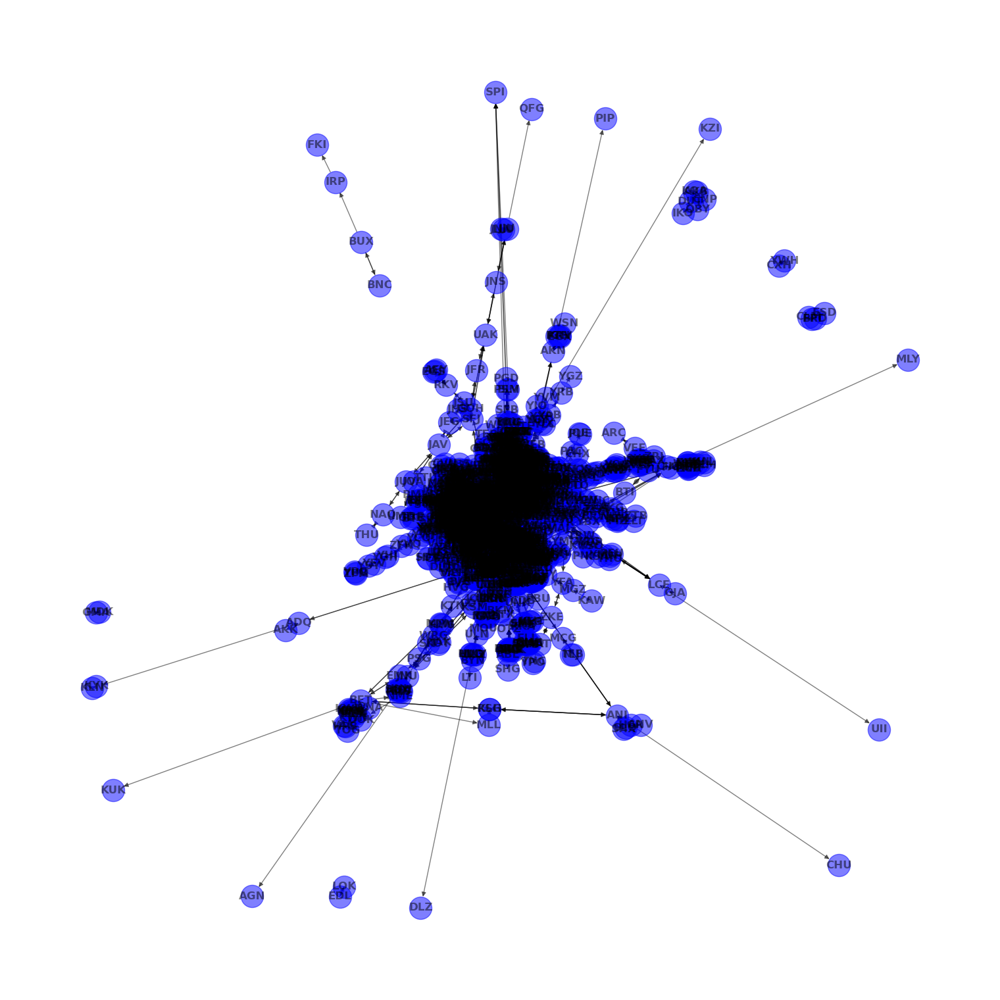

In [84]:
random.seed(42)
G = nx.from_pandas_edgelist(routes, 'Source airport', 'Destination airport', True, nx.DiGraph())
nx.set_node_attributes(G, airport_nodes.set_index('IATA').to_dict('index'))

# plot the network
nx.draw(G, with_labels=True, node_color="blue", node_size=600, font_weight='bold', 
        edge_color="black", alpha=0.5)

### Degree of Connections

In [42]:
# get the min and max for the degree
degree_airports = nx.degree(G)
degree_airports_min = min(dict(degree_airports).values())
degree_airports_max = max(dict(degree_airports).values())
print(f'For the degree of connections, the min is {degree_airports_min} and the max is {degree_airports_max}')

For the degree of connections, the min is 1 and the max is 453


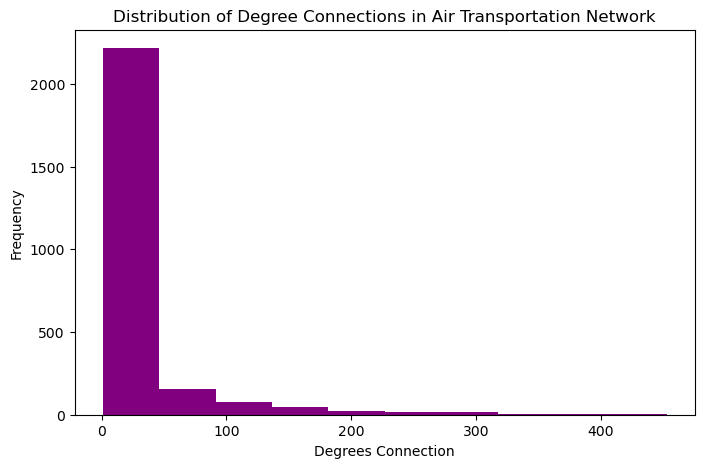

In [149]:
# get the top 5
airports_sorted = sorted(dict(degree_airports).items(), key=lambda item: item[1], reverse=True)
top_5_airports_degree = airports_sorted[:5]

# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_sorted).values(), color = "purple")
plt.xlabel('Degrees Connection')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Connections in Air Transportation Network');

In [44]:
airport_conn_df = pd.DataFrame(degree_airports, columns = ['IATA', 'Degree_Connections'])
airport_conn_df = pd.merge(airport_conn_df, airports_columns, on='IATA', how='inner')
sorted_airport_conn_df = airport_conn_df.sort_values('Degree_Connections', ascending = False)
top_5_sorted_airport_conn_df = sorted_airport_conn_df.head()
top_5_sorted_airport_conn_df

,IATA,Degree_Connections,Name,City,Country,Latitude,Longitude,Hemisphere
448,FRA,453,Frankfurt am Main Airport,Frankfurt,Germany,50.033333,8.570556,E
697,IST,441,Istanbul Airport,Istanbul,Turkey,41.275278,28.751944,E
395,CDG,440,Charles de Gaulle International Airport,Paris,France,49.012798,2.550000,E
180,AMS,440,Amsterdam Airport Schiphol,Amsterdam,Netherlands,52.308601,4.763890,E
155,ATL,417,Hartsfield Jackson Atlanta International Airport,Atlanta,United States,33.636700,-84.428101,W


In [45]:
sorted_airport_conn_df.tail()

,IATA,Degree_Connections,Name,City,Country,Latitude,Longitude,Hemisphere
1960,KPV,1,Perryville Airport,Perryville,United States,55.905998,-159.162993,W
1961,PTH,1,Port Heiden Airport,Port Heiden,United States,56.959099,-158.632996,W
2019,ELV,1,Elfin Cove Seaplane Base,Elfin Cove,United States,58.195202,-136.347000,W
2024,AGN,1,Angoon Seaplane Base,Angoon,United States,57.503601,-134.585007,W
680,SLQ,1,Sleetmute Airport,Sleetmute,United States,61.700500,-157.166000,W


In [46]:
airport_conn_df.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()

Hemisphere Degree_Connections                                             \
                          count       mean        std  min  25%  50%   75%   
0          E             1378.0  28.933237  55.336666  1.0  4.0  8.0  24.0   
1          W             1191.0  21.759866  49.101433  1.0  2.0  6.0  16.0   

          
     max  
0  453.0  
1  417.0

In [47]:
degW = airport_conn_df[airport_conn_df.Hemisphere=='W']
degE = airport_conn_df[airport_conn_df.Hemisphere=='E']

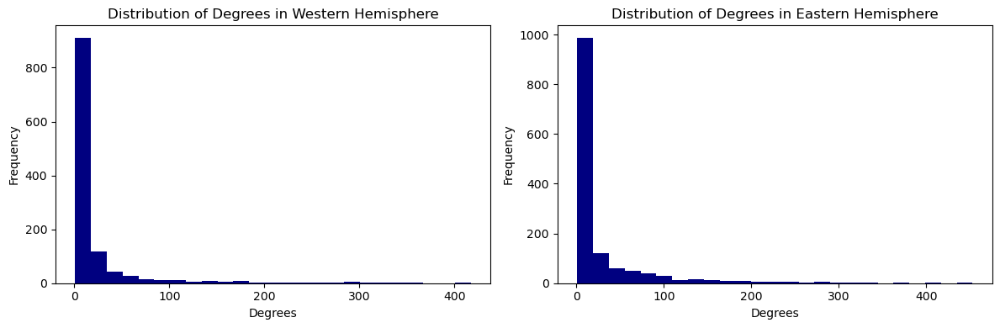

In [48]:
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(degW['Degree_Connections'], 25, color = "navy")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in Western Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(degE['Degree_Connections'], 25, color = "navy")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in Eastern Hemisphere')

plt.tight_layout()
plt.show()

### Degree Centrality

In [49]:
# get the min and max of degree centrality
airports_dc = nx.degree_centrality(G) 
airports_dc_min = min(dict(airports_dc).values())
airports_dc_max = max(dict(airports_dc).values())
print(f'For the degree centrality, the min is {airports_dc_min} and the max is {airports_dc_max}')

For the degree centrality, the min is 0.0003894080996884735 and the max is 0.1764018691588785


In [50]:
# get the top 5
airports_dc_sorted = sorted(airports_dc.items(), key=lambda item: item[1], reverse=True)
top_5_airports_dc = airports_dc_sorted[:5]
top_5_airports_dc

[('FRA', 0.1764018691588785),
 ('IST', 0.17172897196261683),
 ('AMS', 0.17133956386292834),
 ('CDG', 0.17133956386292834),
 ('ATL', 0.16238317757009346)]

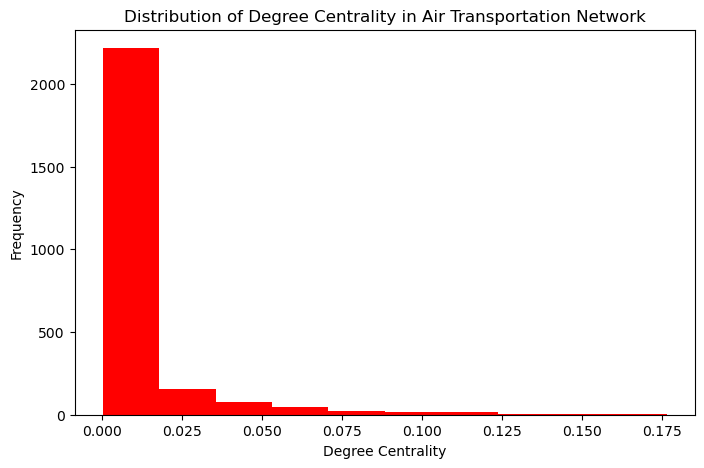

In [51]:
# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_dc_sorted).values(), color = "red")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Centrality in Air Transportation Network');

In [158]:
airports_dc_df = pd.DataFrame.from_dict(airports_dc, orient='index').reset_index()
airports_dc_df.columns = ['IATA', 'Degree_Centrality']
airports_dc_df = pd.merge(airports_dc_df, airports_columns, on='IATA', how='inner')
sorted_airports_dc_df = airports_dc_df.sort_values('Degree_Centrality', ascending = False)
top_5_sorted_airports_dc_df = sorted_airports_dc_df.head(10)
top_5_sorted_airports_dc_df

,IATA,Degree_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
448,FRA,0.176402,Frankfurt am Main Airport,Frankfurt,Germany,50.033333,8.570556,E
697,IST,0.171729,Istanbul Airport,Istanbul,Turkey,41.275278,28.751944,E
395,CDG,0.171340,Charles de Gaulle International Airport,Paris,France,49.012798,2.550000,E
180,AMS,0.171340,Amsterdam Airport Schiphol,Amsterdam,Netherlands,52.308601,4.763890,E
155,ATL,0.162383,Hartsfield Jackson Atlanta International Airport,Atlanta,United States,33.636700,-84.428101,W
85,ORD,0.158489,Chicago O'Hare International Airport,Chicago,United States,41.978600,-87.904800,W
242,PEK,0.155374,Beijing Capital International Airport,Beijing,China,40.080101,116.584999,E
146,MUC,0.146417,Munich Airport,Munich,Germany,48.353802,11.786100,E
6,DME,0.146417,Domodedovo International Airport,Moscow,Russia,55.408798,37.906300,E
991,DFW,0.140187,Dallas Fort Worth International Airport,Dallas-Fort Worth,United States,32.896801,-97.038002,W


In [159]:
sorted_airports_dc_df.tail(10)

,IATA,Degree_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
459,MLY,0.000389,Manley Hot Springs Airport,Manley Hot Springs,United States,64.997597,-150.643997,W
1937,QFG,0.000389,Eqalugaarsuit Heliport,Eqalugaarsuit,Greenland,60.619720,-45.914062,W
1942,KZI,0.000389,Filippos Airport,Kozani,Greece,40.286098,21.840799,E
1951,PIP,0.000389,Pilot Point Airport,Pilot Point,United States,57.580399,-157.572006,W
1959,IGG,0.000389,Igiugig Airport,Igiugig,United States,59.324001,-155.901993,W
1960,KPV,0.000389,Perryville Airport,Perryville,United States,55.905998,-159.162993,W
1961,PTH,0.000389,Port Heiden Airport,Port Heiden,United States,56.959099,-158.632996,W
2019,ELV,0.000389,Elfin Cove Seaplane Base,Elfin Cove,United States,58.195202,-136.347000,W
2024,AGN,0.000389,Angoon Seaplane Base,Angoon,United States,57.503601,-134.585007,W
680,SLQ,0.000389,Sleetmute Airport,Sleetmute,United States,61.700500,-157.166000,W


In [54]:
airports_dc_df.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()

Hemisphere Degree_Centrality                                          \
                         count      mean       std       min       25%   
0          E            1378.0  0.011267  0.021549  0.000389  0.001558   
1          W            1191.0  0.008473  0.019120  0.000389  0.000779   

                                 
        50%       75%       max  
0  0.003115  0.009346  0.176402  
1  0.002336  0.006231  0.162383

In [55]:
dcW = airports_dc_df[airports_dc_df.Hemisphere=='W']
dcE = airports_dc_df[airports_dc_df.Hemisphere=='E']

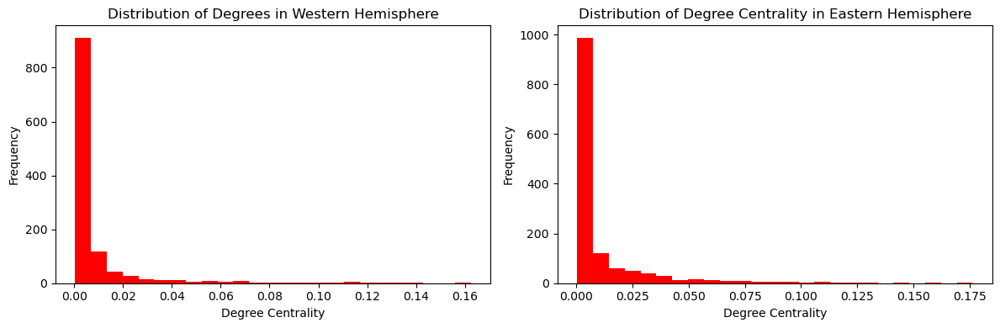

In [56]:
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(dcW['Degree_Centrality'], 25, color = "red")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in Western Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(dcE['Degree_Centrality'], 25, color = "red")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Centrality in Eastern Hemisphere')

plt.tight_layout()
plt.show()

### Eigenvector Centrality

In [57]:
# get the min and max for closeness centrality
airports_eig = nx.eigenvector_centrality(G)
airports_eig_min = min(dict(airports_eig).values())
airports_eig_max = max(dict(airports_eig).values())
print(f'For the eigenvector centrality, the min is {airports_eig_min} and the max is {airports_eig_max}')

For the eigenvector centrality, the min is 1.3934174087034389e-42 and the max is 0.1650118284725382


In [58]:
# get the top 10
airports_eig_sorted = sorted(airports_eig.items(), key=lambda item: item[1], reverse=True)
top_5_airports_eig = airports_eig_sorted[:5]
top_5_airports_eig

[('AMS', 0.1650118284725382),
 ('FRA', 0.16478551566587704),
 ('CDG', 0.15699618023853631),
 ('MUC', 0.15029677476178496),
 ('FCO', 0.1361103246327817)]

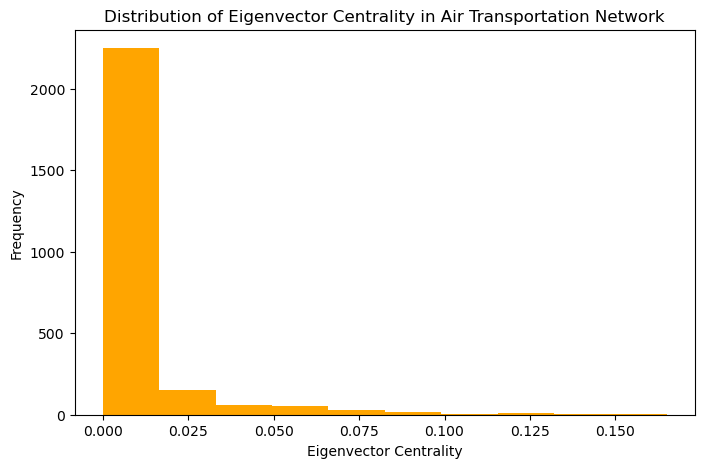

In [148]:
# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_eig_sorted).values(), color = "orange")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Air Transportation Network');

In [59]:
airports_eig_df = pd.DataFrame.from_dict(airports_eig, orient='index').reset_index()
airports_eig_df.columns = ['IATA', 'Eigenvector_Centrality']
airports_eig_df = pd.merge(airports_eig_df, airports_columns, on='IATA', how='inner')
sorted_airports_eig_df = airports_eig_df.sort_values('Eigenvector_Centrality', ascending = False)
top_5_sorted_airports_eig_df = sorted_airports_eig_df.head()
top_5_sorted_airports_eig_df

,IATA,Eigenvector_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
180,AMS,0.165012,Amsterdam Airport Schiphol,Amsterdam,Netherlands,52.308601,4.763890,E
448,FRA,0.164786,Frankfurt am Main Airport,Frankfurt,Germany,50.033333,8.570556,E
395,CDG,0.156996,Charles de Gaulle International Airport,Paris,France,49.012798,2.550000,E
146,MUC,0.150297,Munich Airport,Munich,Germany,48.353802,11.786100,E
403,FCO,0.136110,Leonardo da Vinci–Fiumicino Airport,Rome,Italy,41.800278,12.238889,E


In [60]:
sorted_airports_eig_df.tail()

,IATA,Eigenvector_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
680,SLQ,1.393417e-42,Sleetmute Airport,Sleetmute,United States,61.700500,-157.166000,W
474,PTU,1.393417e-42,Platinum Airport,Port Moller,United States,59.011398,-161.820007,W
1960,KPV,1.393417e-42,Perryville Airport,Perryville,United States,55.905998,-159.162993,W
1959,IGG,1.393417e-42,Igiugig Airport,Igiugig,United States,59.324001,-155.901993,W
2393,MSW,1.393417e-42,Massawa International Airport,Massawa,Eritrea,15.670000,39.370098,E


In [61]:
airports_eig_df.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()

Hemisphere Eigenvector_Centrality                                    \
                              count      mean       std           min   
0          E                 1378.0  0.009143  0.020079  1.393417e-42   
1          W                 1191.0  0.006342  0.015388  1.393417e-42   

                                           
        25%       50%       75%       max  
0  0.000425  0.001791  0.006819  0.165012  
1  0.000102  0.000884  0.004275  0.135338

In [62]:
eigW = airports_eig_df[airports_eig_df.Hemisphere=='W']
eigE = airports_eig_df[airports_eig_df.Hemisphere=='E']

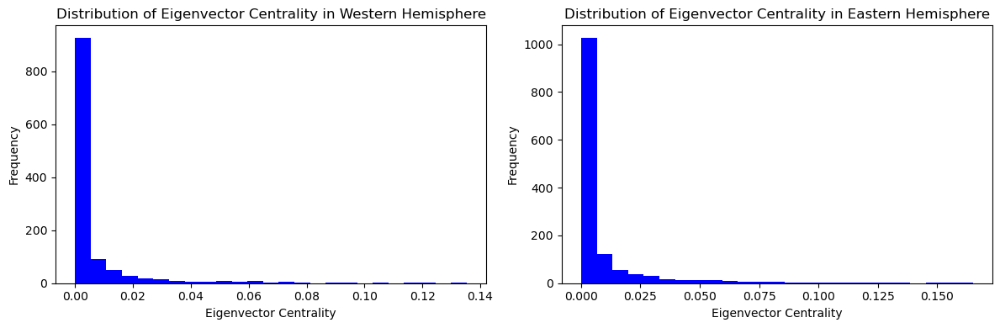

In [ ]:
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(eigW['Eigenvector_Centrality'], 25, color = "blue")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Western Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(eigE['Eigenvector_Centrality'], 25, color = "blue")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Eastern Hemisphere')

plt.tight_layout()
plt.show()

### Putting it Altogether

In [64]:
df_merged = pd.concat([top_5_sorted_airport_conn_df, top_5_sorted_airports_dc_df,
                     top_5_sorted_airports_eig_df])

In [65]:
df_merged = mc.MoveTo3(df_merged,'Degree_Centrality')

In [66]:
df_merged = mc.MoveTo4(df_merged,'Eigenvector_Centrality')

In [67]:
df_merged = mc.MoveTo2(df_merged,'Name')

In [68]:
df_merged

,IATA,Name,Degree_Connections,Degree_Centrality,Eigenvector_Centrality,City,Country,Latitude,Longitude,Hemisphere
448,FRA,Frankfurt am Main Airport,453.0,NaN,NaN,Frankfurt,Germany,50.033333,8.570556,E
697,IST,Istanbul Airport,441.0,NaN,NaN,Istanbul,Turkey,41.275278,28.751944,E
395,CDG,Charles de Gaulle International Airport,440.0,NaN,NaN,Paris,France,49.012798,2.550000,E
180,AMS,Amsterdam Airport Schiphol,440.0,NaN,NaN,Amsterdam,Netherlands,52.308601,4.763890,E
155,ATL,Hartsfield Jackson Atlanta International Airport,417.0,NaN,NaN,Atlanta,United States,33.636700,-84.428101,W
448,FRA,Frankfurt am Main Airport,NaN,0.176402,NaN,Frankfurt,Germany,50.033333,8.570556,E
697,IST,Istanbul Airport,NaN,0.171729,NaN,Istanbul,Turkey,41.275278,28.751944,E
395,CDG,Charles de Gaulle International Airport,NaN,0.171340,NaN,Paris,France,49.012798,2.550000,E
180,AMS,Amsterdam Airport Schiphol,NaN,0.171340,NaN,Amsterdam,Netherlands,52.308601,4.763890,E
155,ATL,Hartsfield Jackson Atlanta International Airport,NaN,0.162383,NaN,Atlanta,United States,33.636700,-84.428101,W


Among the top 5 airports with the highest degree centrality in the Northern Hemisphere, the only airport that is in the Western Hemisphere was Hartsfield Jackson Atlanta International Airport, with 417 connections and a degree centrality of 0.162383. The airports that were in the top 5 in both degree and eigenvector centralities were Frankfurt am Main Airport in Frankfurt, Germany, Amsterdam Airport Schiphol in Amsterdam, Netherlands, and Charles de Gaulle International Airport in Paris, France. There high values in degree and eigenvector centralities indicate that their respective airports are integral in the global air transportation network. Surprisingly, the United States did not have any airports in the top 5 of eigenvector centrality and had only one airport that was ranked 5th among the top 5 airports in degree centrality. Additionally, heavily populated cities like New York and Los Angeles were not in the top 5, which is interesting considering the amount of people from around the world who travel to those cities.

### T-Test

#### Degree Connections

In [69]:
degW1 = degW.iloc[:,[1]]
degE1 = degE.iloc[:,[1]]

t_deg,p_deg = stats.ttest_ind(degW1.values,degE1.values)

t_deg

array([-3.45100925])

In [70]:
p_deg

array([0.00056752])

#### Degree Centrality

In [71]:
t_dc, p_dc = stats.ttest_ind(dcW.iloc[:,1],dcE.iloc[:,1])

t_dc

-3.451009250956225

In [72]:
p_dc

0.0005675182108295289

#### Eigenvector Centrality

In [73]:
t_eig, p_eig = stats.ttest_ind(eigW.iloc[:,1],eigE.iloc[:,1])

p_eig

9.064219075483741e-05

In [74]:
t_eig

-3.9205968249000134

### Visualizing Air Transportation Networks for Eastern and Western Hemisphere

#### Degree Connections - Western Hemisphere

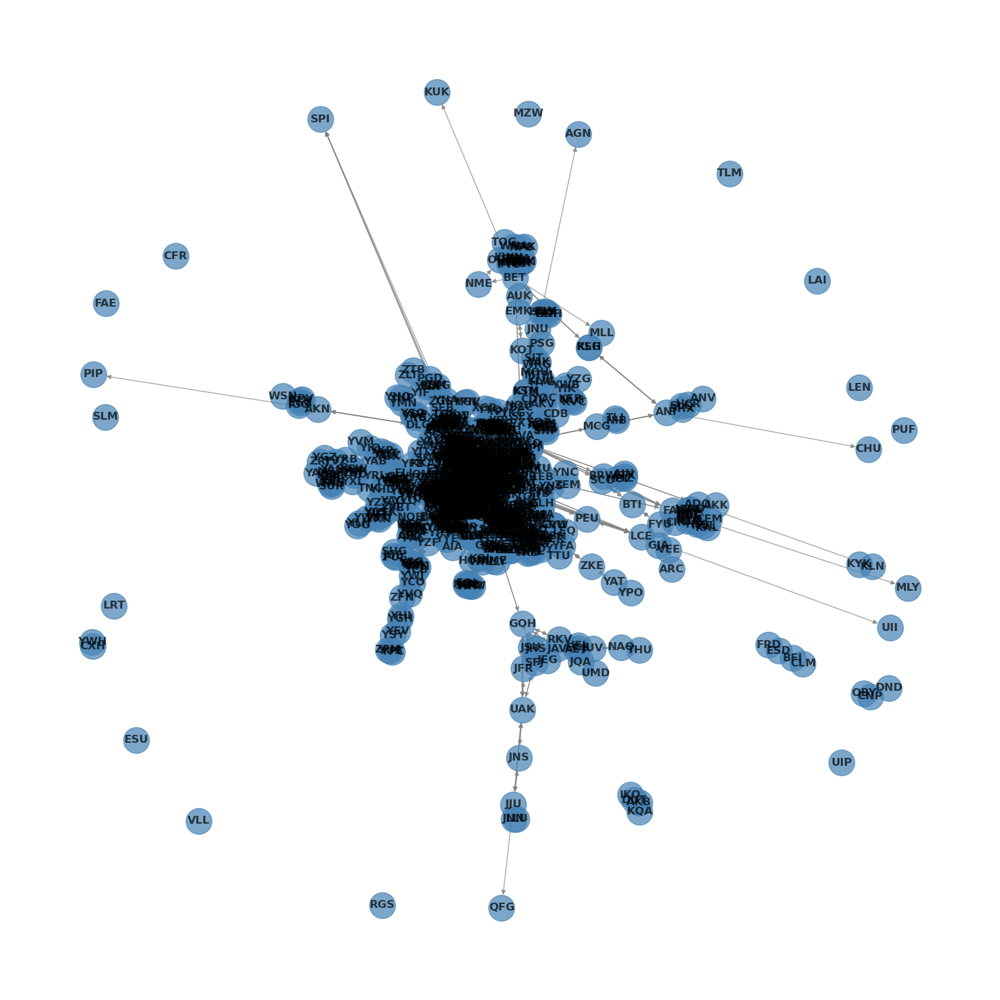

In [75]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

H = G.subgraph(list(degW['IATA']))

# Draw the Graph
nx.draw(H, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

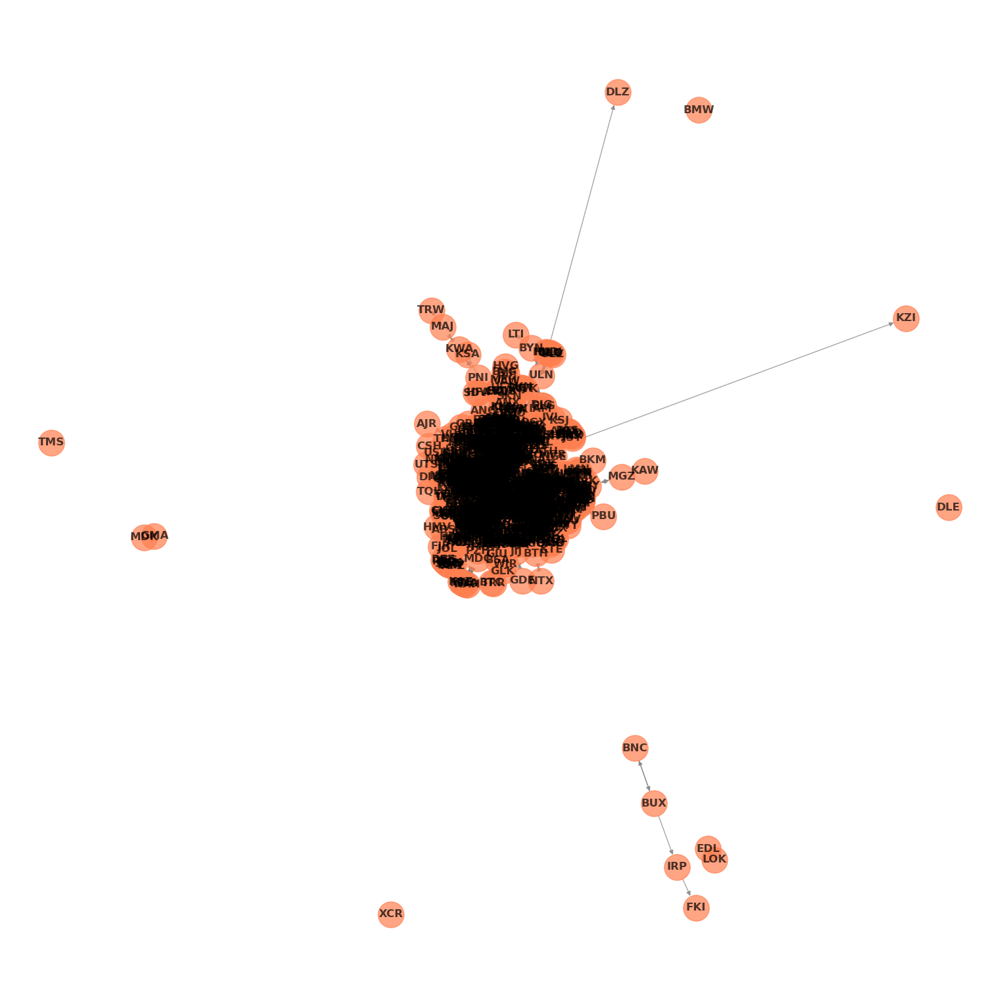

In [76]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

I = G.subgraph(list(degE['IATA']))

# Draw the Graph
nx.draw(I, with_labels=True, node_size=800, node_color='coral', font_weight='bold', 
        edge_color="grey", alpha=0.7) 

#### Degree Centrality

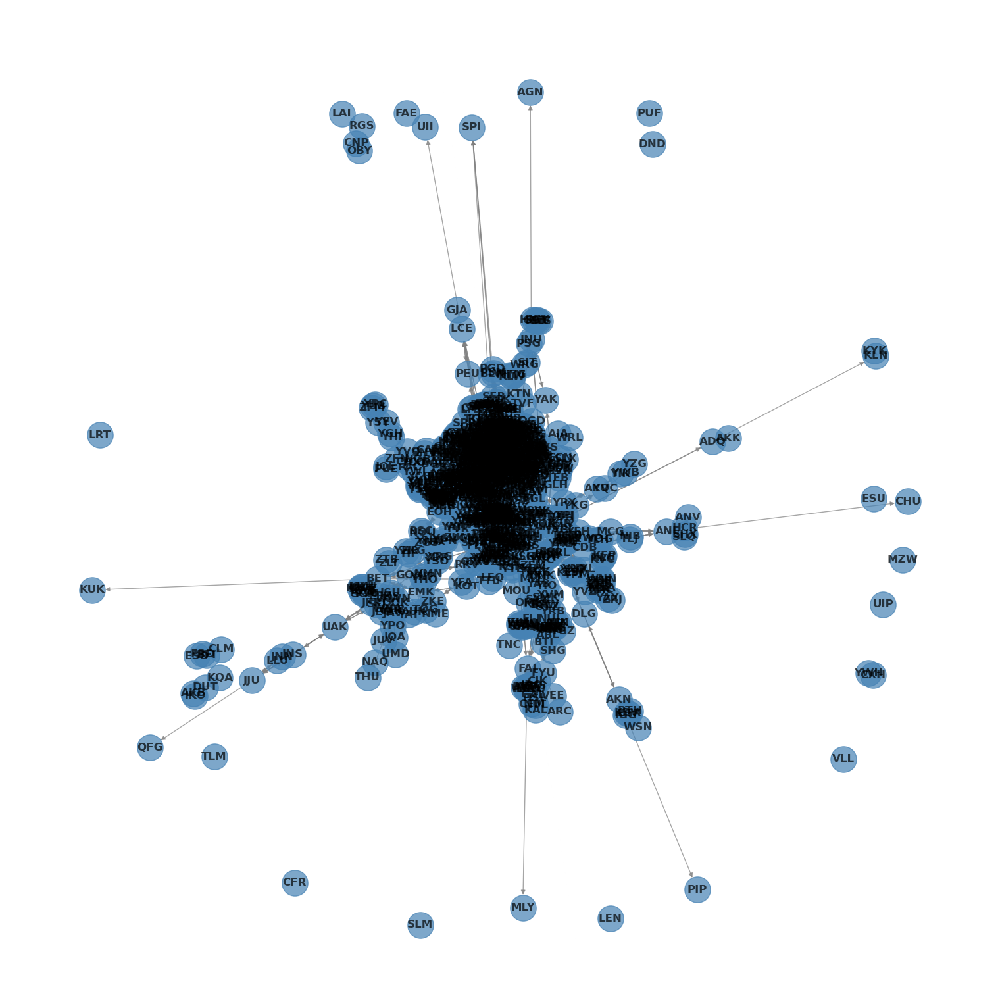

In [77]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

dcw = G.subgraph(list(dcW['IATA']))

# Draw the Graph
nx.draw(dcw, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

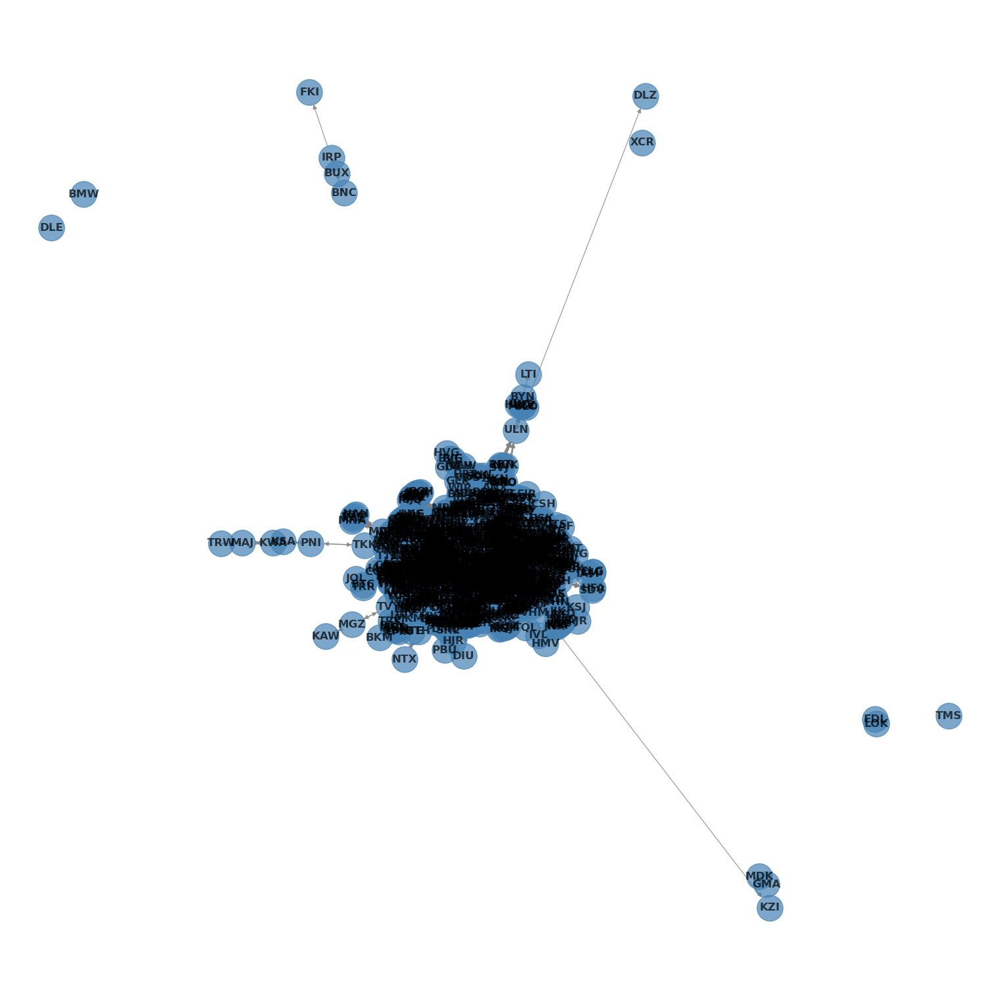

In [78]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

dce = G.subgraph(list(dcE['IATA']))

# Draw the Graph
nx.draw(dce, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

#### Eigenvector Centrality

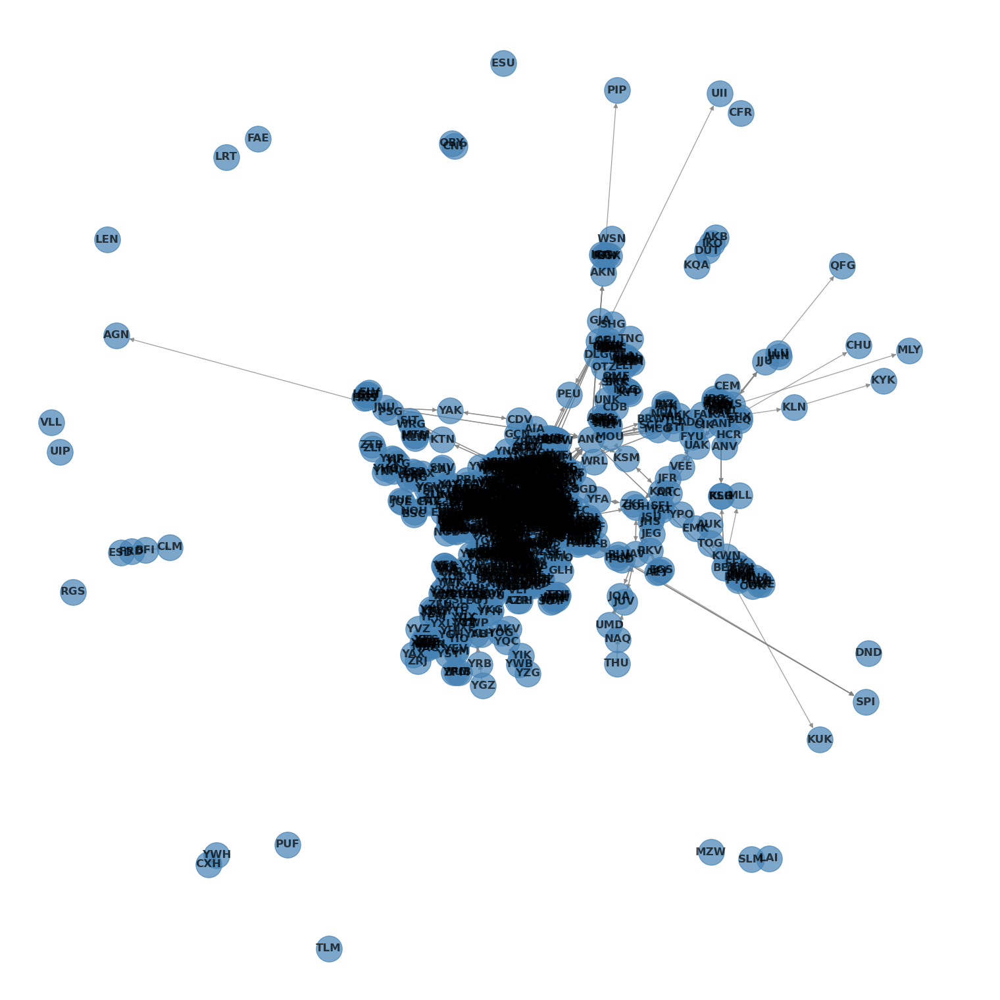

In [79]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

eigw = G.subgraph(list(eigW['IATA']))

# Draw the Graph
nx.draw(eigw, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

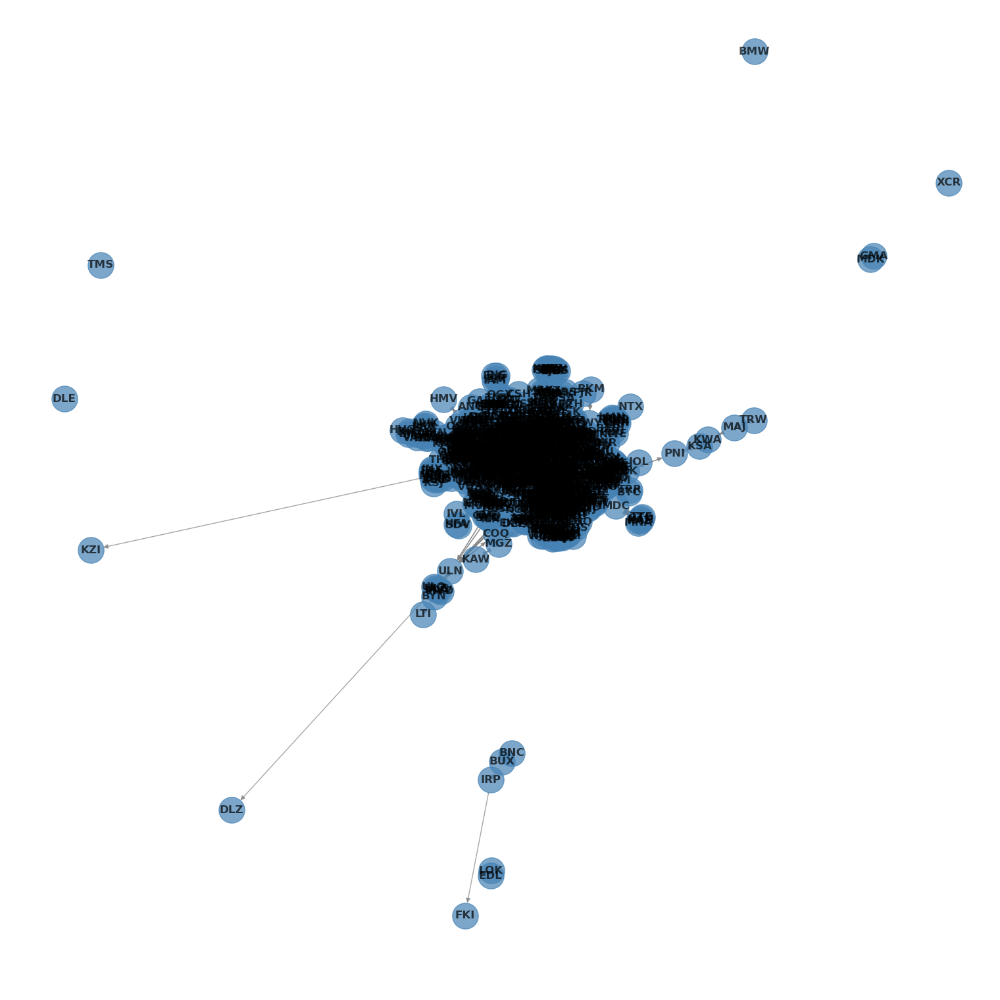

In [80]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

eige = G.subgraph(list(eigE['IATA']))

# Draw the Graph
nx.draw(eige, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

The visualization for each centrality measure did not produce a fully connected route network, and would be an area that can be improved on in a future network analysis.

# Southern Hemisphere

In [111]:
# filter on southern hemisphere
airports_columns2 = airports_df.iloc[:, [2, 3, 4, 5, 7, 8]]
airports_southern = airports_columns2[airports_columns2['Latitude'] < 0]
airports_southern.head()

,Name,City,Country,IATA,Latitude,Longitude
0,Goroka Airport,Goroka,Papua New Guinea,GKA,-6.081690,145.391998
1,Madang Airport,Madang,Papua New Guinea,MAG,-5.207080,145.789001
2,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,-5.826790,144.296005
3,Nadzab Airport,Nadzab,Papua New Guinea,LAE,-6.569803,146.725977
4,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,-9.443380,147.220001


In [112]:
airports_southern['Hemisphere'] = np.where(airports_southern['Longitude'] < 0, 'W', 'E')
airports_southern.iloc[4:8]

/var/folders/h4/zjq554hs0b57vqfcrc5738wh0000gn/T/ipykernel_17650/3679516802.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airports_southern['Hemisphere'] = np.where(airports_southern['Longitude'] < 0, 'W', 'E')


,Name,City,Country,IATA,Latitude,Longitude,Hemisphere
4,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,-9.443380,147.220001,E
5,Wewak International Airport,Wewak,Papua New Guinea,WWK,-3.583830,143.669006,E
573,Mount Pleasant Airport,Mount Pleasant,Falkland Islands,MPN,-51.822800,-58.447201,W
773,Alexander Bay Airport,Alexander Bay,South Africa,ALJ,-28.575001,16.533300,E


In [91]:
airport_nodes2 = pd.DataFrame(airport_nodes, columns = ['IATA'])
airport_nodes_merge_southern = pd.merge(airport_nodes, airports_southern, on='IATA', how='inner')
airport_nodes_merge_southern.head()

,IATA,Name,City,Country,Latitude,Longitude,Hemisphere
0,VAO,Suavanao Airport,Suavanao,Solomon Islands,-7.585560,158.731003,E
1,CPT,Cape Town International Airport,Cape Town,South Africa,-33.964802,18.601700,E
2,BFN,Bram Fischer International Airport,Bloemfontein,South Africa,-29.092699,26.302401,E
3,FTE,El Calafate Airport,El Calafate,Argentina,-50.280300,-72.053101,W
4,CED,Ceduna Airport,Ceduna,Australia,-32.130600,133.710007,E


In [93]:
len(airport_nodes_merge_southern)

681

For the southern hemisphere, there are not alot of airports hence the dataset is much smaller.

In [94]:
# merge route and southern hemisphere data
routes_merge3 = pd.merge(routes_columns,airport_nodes_merge_southern[['IATA']],left_on='Source airport',right_on='IATA',how='inner')
routes_merge4 = pd.merge(routes_merge,airport_nodes_merge_southern[['IATA']],left_on='Destination airport',right_on='IATA',how='inner')
routes_southern = routes_merge4.loc[:, 'Source airport':'Stops']
routes_southern.head()

,Source airport,Destination airport,Stops
0,BOG,GYE,0
1,BOG,UIO,0
2,CLO,GYE,0
3,MGQ,NBO,0
4,SIN,DRW,0


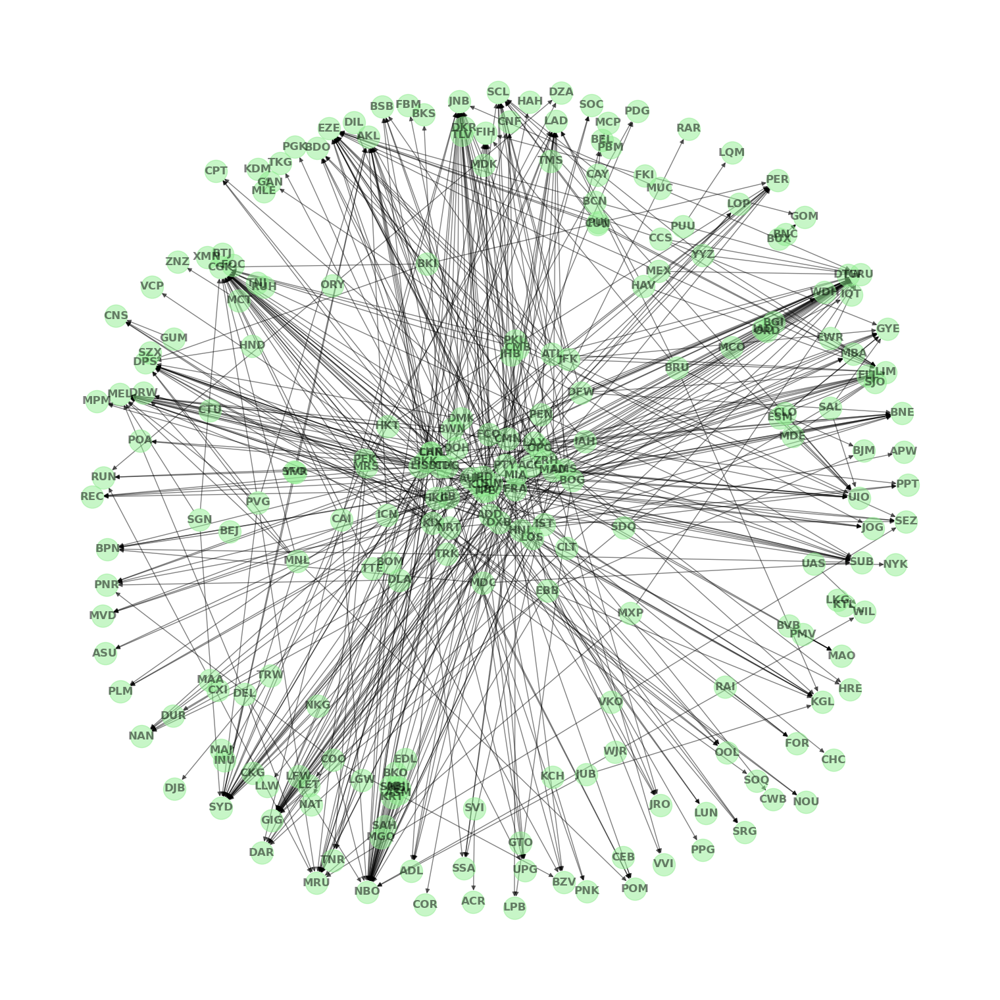

In [95]:
random.seed(42)
G2 = nx.from_pandas_edgelist(routes_southern, 'Source airport', 'Destination airport', True, nx.DiGraph())
nx.set_node_attributes(G2, airport_nodes2.set_index('IATA').to_dict('index'))

# plot the network for southern hemisphere
nx.draw(G2, with_labels=True, node_color="lightgreen", node_size=600, font_weight='bold', 
        edge_color="black", alpha=0.5)

### Degree of Connections

In [96]:
# get the min and max for the degree
degree_airports_southern = nx.degree(G2)
degree_airports_min_south = min(dict(degree_airports_southern).values())
degree_airports_max_south = max(dict(degree_airports_southern).values())
print(f'For the degree of connections, the min is {degree_airports_min_south} and the max is {degree_airports_max_south}')

For the degree of connections, the min is 1 and the max is 36


In [132]:
airport_conn_df_south = pd.DataFrame(degree_airports_southern, columns = ['IATA', 'Degree_Connections'])
airport_conn_df_south = pd.merge(airport_conn_df_south, airports_southern, on='IATA', how='inner')
sorted_airport_conn_df_south = airport_conn_df_south.sort_values('Degree_Connections', ascending = False)
top_5_sorted_airport_conn_df_south = sorted_airport_conn_df_south.head()
top_5_sorted_airport_conn_df_south

,IATA,Degree_Connections,Name,City,Country,Latitude,Longitude,Hemisphere
8,CGK,36,Soekarno-Hatta International Airport,Jakarta,Indonesia,-6.125570,106.655998,E
13,GRU,36,Guarulhos - Governador André Franco Montoro In...,Sao Paulo,Brazil,-23.435556,-46.473057,W
2,NBO,34,Jomo Kenyatta International Airport,Nairobi,Kenya,-1.319240,36.927799,E
12,JNB,26,OR Tambo International Airport,Johannesburg,South Africa,-26.139200,28.246000,E
16,LIM,24,Jorge Chávez International Airport,Lima,Peru,-12.021900,-77.114305,W


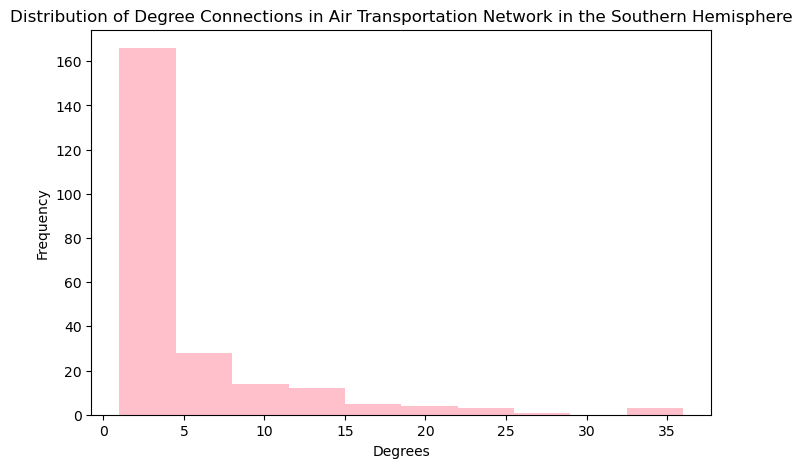

In [113]:
# get the top 5
airports_sorted_south = sorted(dict(degree_airports_southern).items(), key=lambda item: item[1], reverse=True)
top_5_airports_degree_south = airports_sorted_south[:5]

# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_sorted_south).values(), color = "pink")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Connections in Air Transportation Network in the Southern Hemisphere');

In [101]:
airport_conn_df_south.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()

Hemisphere Degree_Connections                                              
                          count      mean       std  min  25%  50%  75%   max
0          E               63.0  6.047619  7.466978  1.0  2.0  3.0  6.0  36.0
1          W               31.0  5.967742  8.288481  1.0  1.0  3.0  4.5  36.0

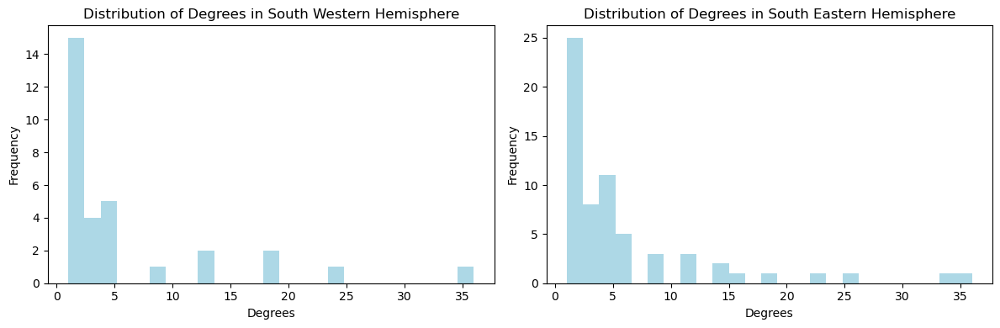

In [103]:
degW_south = airport_conn_df_south[airport_conn_df_south.Hemisphere=='W']
degE_south = airport_conn_df_south[airport_conn_df_south.Hemisphere=='E']

# plot
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(degW_south['Degree_Connections'], 25, color = "lightblue")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in South Western Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(degE_south['Degree_Connections'], 25, color = "lightblue")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in South Eastern Hemisphere')

plt.tight_layout()
plt.show()

### Degree Centrality

In [117]:
# get the min and max of degree centrality
airports_dc_south = nx.degree_centrality(G2) 
airports_dc_min_south = min(dict(airports_dc).values())
airports_dc_max_south = max(dict(airports_dc).values())
print(f'For the degree centrality, the min is {airports_dc_min_south} and the max is {airports_dc_max_south}')

For the degree centrality, the min is 0.0003894080996884735 and the max is 0.1764018691588785


In [118]:
# get the top 5
airports_dc_sorted_south = sorted(airports_dc.items(), key=lambda item: item[1], reverse=True)
top_5_airports_dc_south = airports_dc_sorted[:5]
top_5_airports_dc_south

[('FRA', 0.1764018691588785),
 ('IST', 0.17172897196261683),
 ('AMS', 0.17133956386292834),
 ('CDG', 0.17133956386292834),
 ('ATL', 0.16238317757009346)]

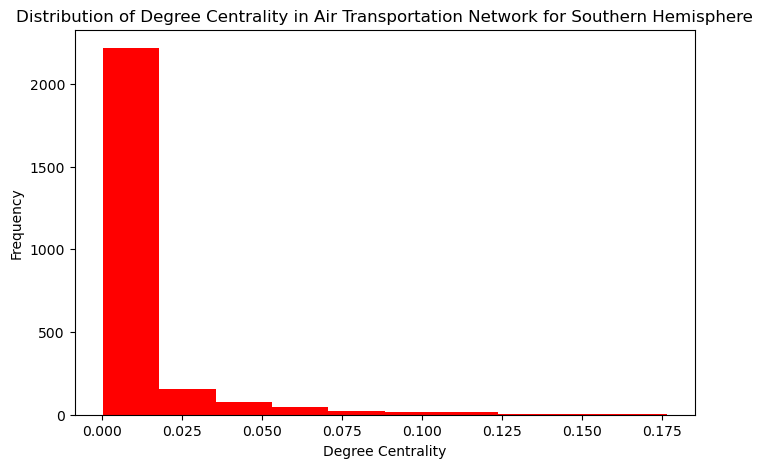

In [119]:
# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_dc_sorted_south).values(), color = "red")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Centrality in Air Transportation Network for Southern Hemisphere');

In [133]:
airports_dc_df_south = pd.DataFrame.from_dict(airports_dc_south, orient='index').reset_index()
airports_dc_df_south.columns = ['IATA', 'Degree_Centrality']
airports_dc_df_south = pd.merge(airports_dc_df_south, airports_southern, on='IATA', how='inner')
sorted_airports_dc_df_south = airports_dc_df_south.sort_values('Degree_Centrality', ascending = False)
top_5_sorted_airports_dc_df_south = sorted_airports_dc_df_south.head()
top_5_sorted_airports_dc_df_south


,IATA,Degree_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
8,CGK,0.153191,Soekarno-Hatta International Airport,Jakarta,Indonesia,-6.125570,106.655998,E
13,GRU,0.153191,Guarulhos - Governador André Franco Montoro In...,Sao Paulo,Brazil,-23.435556,-46.473057,W
2,NBO,0.144681,Jomo Kenyatta International Airport,Nairobi,Kenya,-1.319240,36.927799,E
12,JNB,0.110638,OR Tambo International Airport,Johannesburg,South Africa,-26.139200,28.246000,E
16,LIM,0.102128,Jorge Chávez International Airport,Lima,Peru,-12.021900,-77.114305,W


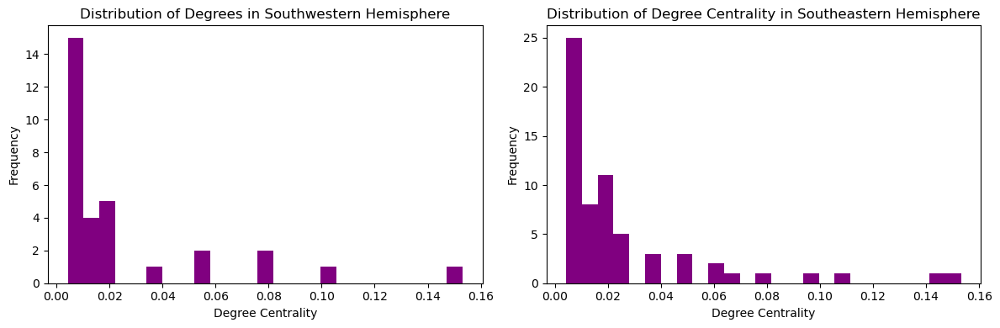

In [128]:
# reset index and set variables for both south west and south east degree centrality
airports_dc_df_south.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()
dcW_south = airports_dc_df_south[airports_dc_df_south.Hemisphere=='W']
dcE_south = airports_dc_df_south[airports_dc_df_south.Hemisphere=='E']

# plot
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(dcW_south['Degree_Centrality'], 25, color = "purple")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in Southwestern Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(dcE_south['Degree_Centrality'], 25, color = "purple")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Centrality in Southeastern Hemisphere')

plt.tight_layout()
plt.show()

### Eigenvector Centrality

In [ ]:
# get the min and max for eigenvector centrality
airports_eig_south = nx.eigenvector_centrality(G2)
airports_eig_min_south = min(dict(airports_eig).values())
airports_eig_max_south = max(dict(airports_eig).values())
print(f'For the eigenvector centrality, the min is {airports_eig_min_south} and the max is {airports_eig_max_south}')

For the eigenvector centrality, the min is 1.3934174087034389e-42 and the max is 0.1650118284725382


In [126]:
# get the top 10
airports_eig_sorted_south = sorted(airports_eig_south.items(), key=lambda item: item[1], reverse=True)
top_5_airports_eig_south = airports_eig_sorted_south[:5]
top_5_airports_eig_south

[('CGK', 0.3809041625024703),
 ('GRU', 0.3809041625024703),
 ('NBO', 0.35974881655447255),
 ('JNB', 0.27512743276248147),
 ('LIM', 0.25397208681448386)]

In [134]:
airports_eig_df_south = pd.DataFrame.from_dict(airports_eig_south, orient='index').reset_index()
airports_eig_df_south.columns = ['IATA', 'Eigenvector_Centrality']
airports_eig_df_south = pd.merge(airports_eig_df_south, airports_southern, on='IATA', how='inner')
sorted_airports_eig_df_south = airports_eig_df_south.sort_values('Eigenvector_Centrality', ascending = False)
top_5_sorted_airports_eig_df_south = sorted_airports_eig_df_south.head()
top_5_sorted_airports_eig_df_south

,IATA,Eigenvector_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
8,CGK,0.380904,Soekarno-Hatta International Airport,Jakarta,Indonesia,-6.125570,106.655998,E
13,GRU,0.380904,Guarulhos - Governador André Franco Montoro In...,Sao Paulo,Brazil,-23.435556,-46.473057,W
2,NBO,0.359749,Jomo Kenyatta International Airport,Nairobi,Kenya,-1.319240,36.927799,E
12,JNB,0.275127,OR Tambo International Airport,Johannesburg,South Africa,-26.139200,28.246000,E
16,LIM,0.253972,Jorge Chávez International Airport,Lima,Peru,-12.021900,-77.114305,W


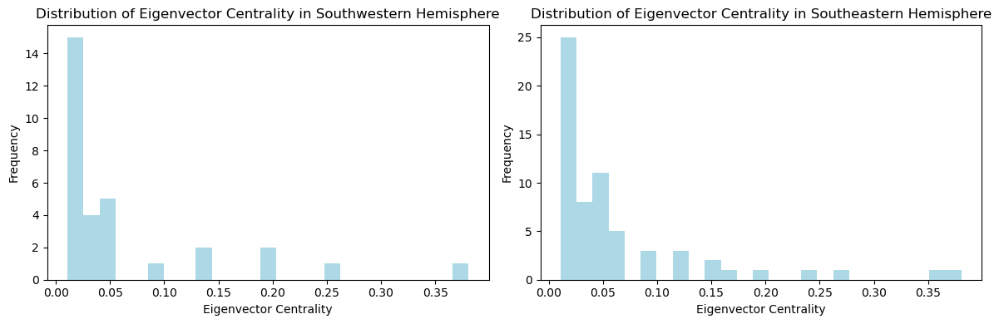

In [135]:
# reset index and create variables for eignvector on both southwest and southeast
airports_eig_df_south.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()
eigW_south = airports_eig_df_south[airports_eig_df_south.Hemisphere=='W']
eigE_south = airports_eig_df_south[airports_eig_df_south.Hemisphere=='E']

plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(eigW_south['Eigenvector_Centrality'], 25, color = "lightblue")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Southwestern Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(eigE_south['Eigenvector_Centrality'], 25, color = "lightblue")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Southeastern Hemisphere')

plt.tight_layout()
plt.show()

### Putting it Altogether

In [152]:
df_merged_south = pd.concat([top_5_sorted_airport_conn_df_south, top_5_sorted_airports_dc_df_south,
                     top_5_sorted_airports_eig_df_south])

In [153]:
df_merged_south = mc.MoveTo3(df_merged_south,'Degree_Centrality')
df_merged_south = mc.MoveTo3(df_merged_south,'Degree_Centrality')
df_merged_south = mc.MoveTo4(df_merged_south,'Eigenvector_Centrality')
df_merged_south = mc.MoveTo2(df_merged_south,'Name')
df_merged_south

,IATA,Name,Degree_Connections,Degree_Centrality,Eigenvector_Centrality,City,Country,Latitude,Longitude,Hemisphere
8,CGK,Soekarno-Hatta International Airport,36.0,NaN,NaN,Jakarta,Indonesia,-6.125570,106.655998,E
13,GRU,Guarulhos - Governador André Franco Montoro In...,36.0,NaN,NaN,Sao Paulo,Brazil,-23.435556,-46.473057,W
2,NBO,Jomo Kenyatta International Airport,34.0,NaN,NaN,Nairobi,Kenya,-1.319240,36.927799,E
12,JNB,OR Tambo International Airport,26.0,NaN,NaN,Johannesburg,South Africa,-26.139200,28.246000,E
16,LIM,Jorge Chávez International Airport,24.0,NaN,NaN,Lima,Peru,-12.021900,-77.114305,W
8,CGK,Soekarno-Hatta International Airport,NaN,0.153191,NaN,Jakarta,Indonesia,-6.125570,106.655998,E
13,GRU,Guarulhos - Governador André Franco Montoro In...,NaN,0.153191,NaN,Sao Paulo,Brazil,-23.435556,-46.473057,W
2,NBO,Jomo Kenyatta International Airport,NaN,0.144681,NaN,Nairobi,Kenya,-1.319240,36.927799,E
12,JNB,OR Tambo International Airport,NaN,0.110638,NaN,Johannesburg,South Africa,-26.139200,28.246000,E
16,LIM,Jorge Chávez International Airport,NaN,0.102128,NaN,Lima,Peru,-12.021900,-77.114305,W


### T-Test

In [155]:
t_dc_south, p_dc_south = stats.ttest_ind(dcW.iloc[:,1],dcE.iloc[:,1])

print(f'For the T-test on the degree of connection, the T value (how different the two groups are relative to the variability in the data) is {t_dc_south} and the P value (statistical significance) is {p_dc_south}')

For the T-test on the degree of connection, the T value (how different the two groups are relative to the variability in the data) is -3.451009250956225 and the P value (statistical significance) is 0.0005675182108295289


In [156]:
t_eig_south, p_eig_south = stats.ttest_ind(eigW.iloc[:,1],eigE.iloc[:,1])

print(f'For the T-test on the eigenvector centrality, the T value (how different the two groups are relative to the variability in the data) is {t_eig_south} and the P value (statistical significance) is {p_eig_south}')

For the T-test on the eigenvector centrality, the T value (how different the two groups are relative to the variability in the data) is -3.9205968249000134 and the P value (statistical significance) is 9.064219075483741e-05


### Visual on Southern Hemisphere

In [163]:
dcW_south

,IATA,Degree_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
0,GYE,0.038298,José Joaquín de Olmedo International Airport,Guayaquil,Ecuador,-2.157420,-79.883598,W
1,UIO,0.055319,Mariscal Sucre International Airport,Quito,Ecuador,-0.129167,-78.357500,W
7,EZE,0.080851,Ministro Pistarini International Airport,Buenos Aires,Argentina,-34.822200,-58.535800,W
10,LQM,0.004255,Caucaya Airport,Puerto Leguízamo,Colombia,-0.182278,-74.770800,W
11,ACR,0.004255,Araracuara Airport,Araracuara,Colombia,-0.583300,-72.408300,W
13,GRU,0.153191,Guarulhos - Governador André Franco Montoro In...,Sao Paulo,Brazil,-23.435556,-46.473057,W
15,GIG,0.080851,Rio Galeão – Tom Jobim International Airport,Rio De Janeiro,Brazil,-22.809999,-43.250557,W
16,LIM,0.102128,Jorge Chávez International Airport,Lima,Peru,-12.021900,-77.114305,W
17,SCL,0.055319,Comodoro Arturo Merino Benítez International A...,Santiago,Chile,-33.393002,-70.785797,W
19,PPT,0.012766,Faa'a International Airport,Papeete,French Polynesia,-17.553699,-149.606995,W


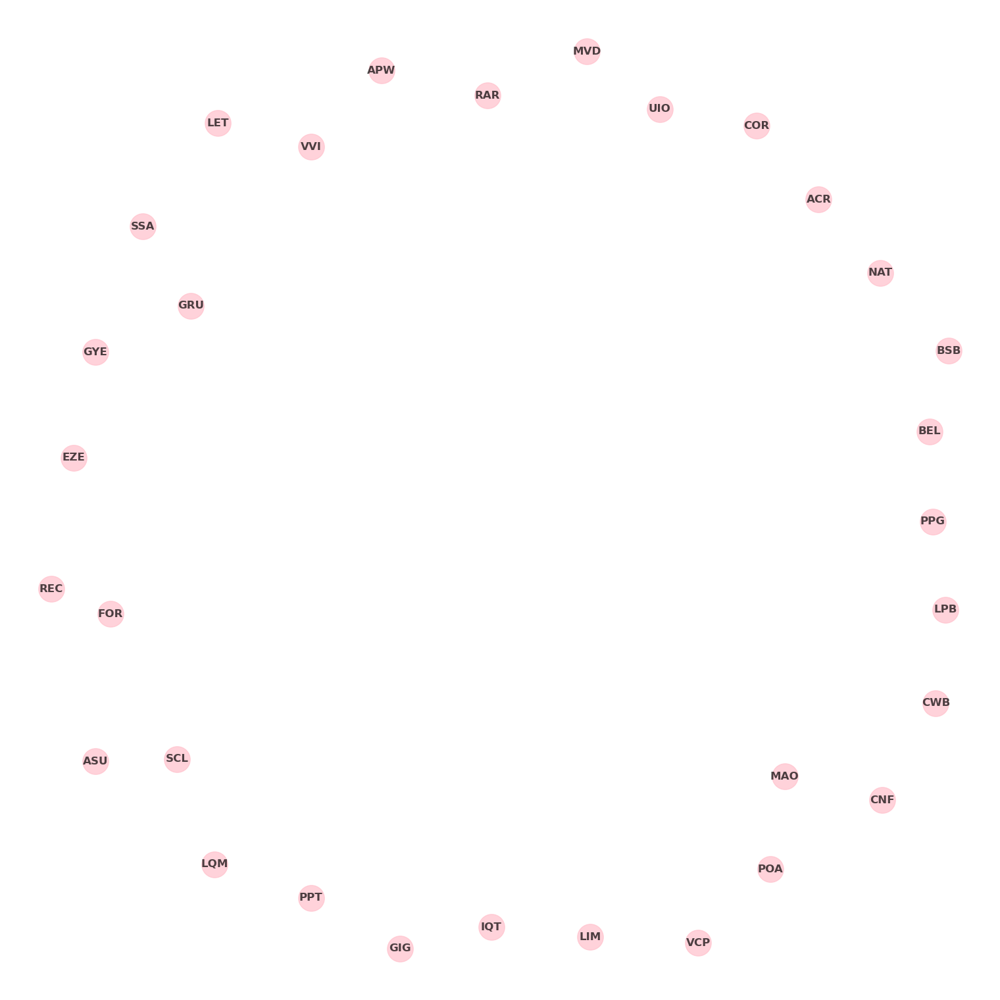

In [160]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

dcw_southern = G2.subgraph(list(dcW_south['IATA']))

# Draw the Graph
nx.draw(dcw_southern, with_labels=True, node_size=800, node_color='pink', font_weight='bold', 
        edge_color="grey", alpha=0.7)

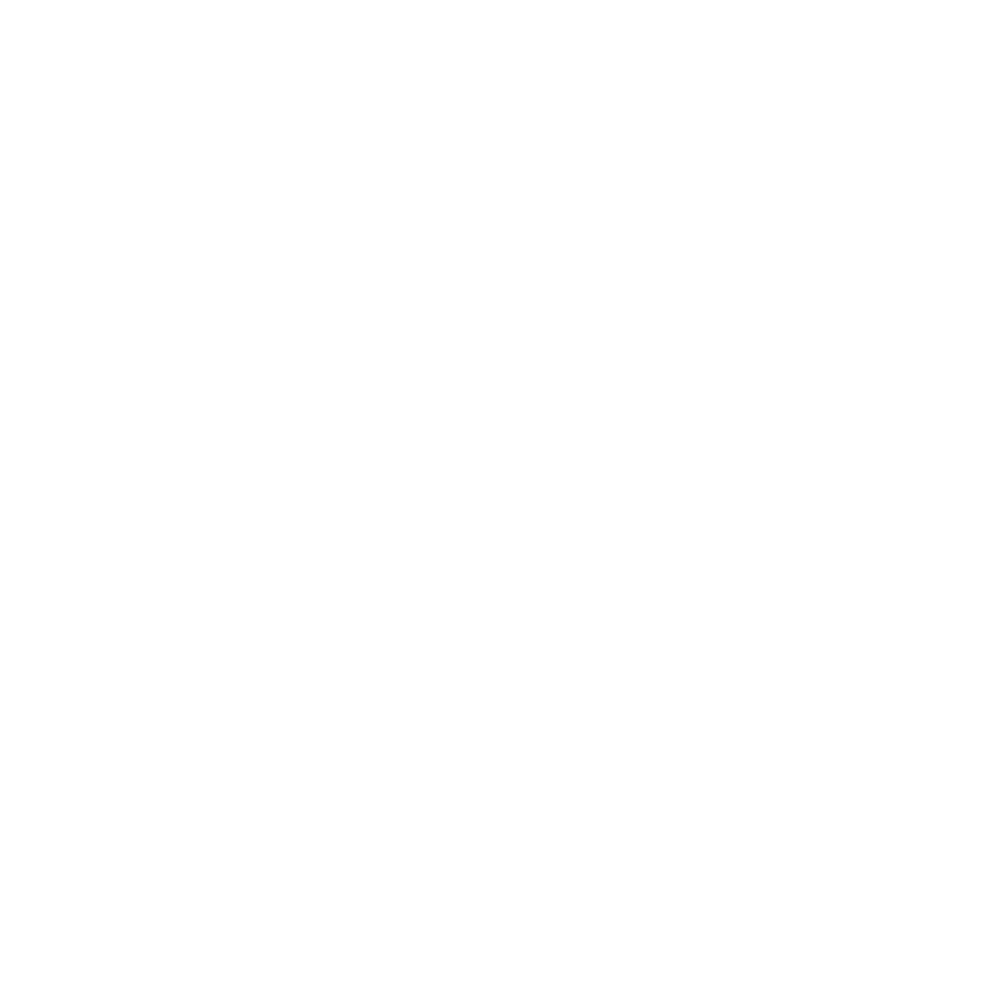

In [164]:
 # set plot size
plt.rcParams["figure.figsize"] = (15,15)

dce_south = G.subgraph(list(dcE_south['IATA']))

# Draw the Graph
nx.draw(dce_south, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

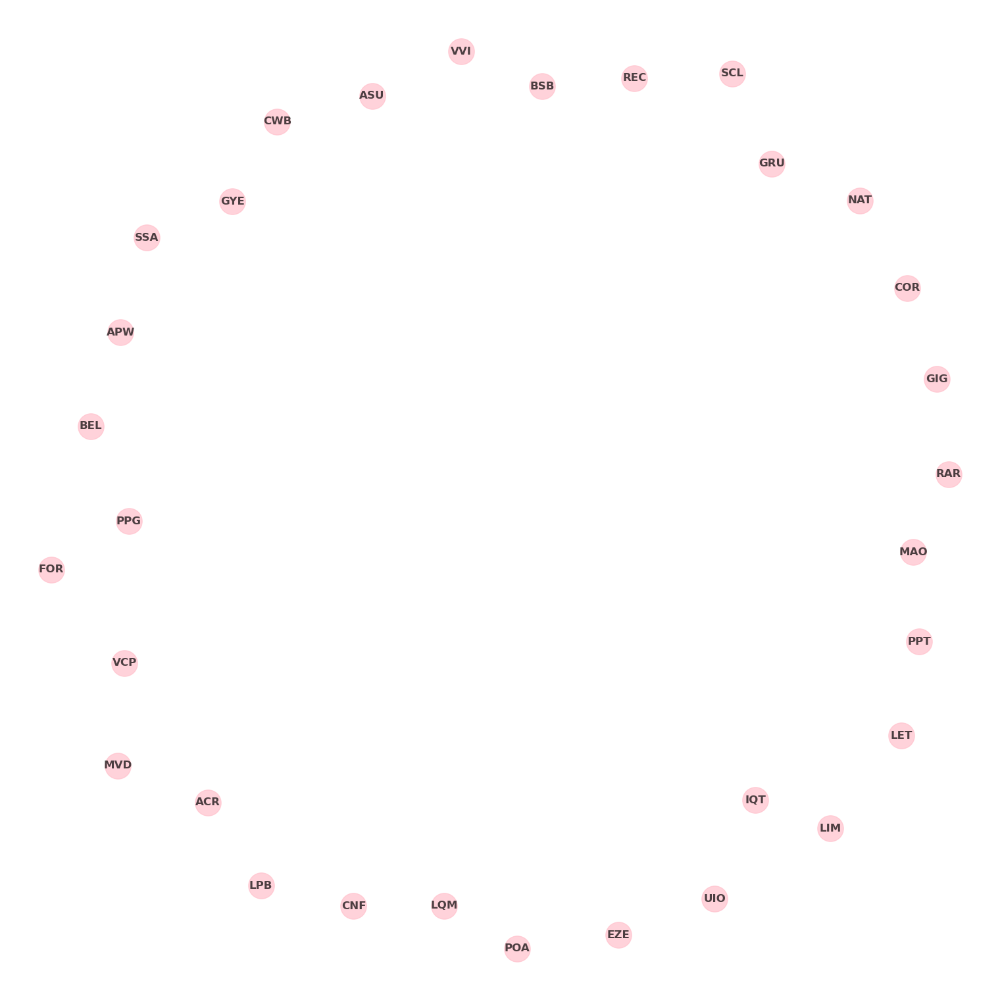

In [147]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

eigw_southern = G2.subgraph(list(eigW_south['IATA']))

# Draw the Graph
nx.draw(eigw_southern, with_labels=True, node_size=800, node_color='pink', font_weight='bold', 
        edge_color="grey", alpha=0.7)